# Applying Glassbox Model to Explaining Life Expectancy in Chicago Census Tracts

## Import Libraries and files

In [2]:
#import libaries
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())
#set pandas column to max
import pandas as pd
pd.set_option('display.max_columns', None)

In [3]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score

from interpret.glassbox import ExplainableBoostingClassifier
from interpret.glassbox import LogisticRegression
from interpret import show

In [4]:
#import final_model into pandas
model = pd.read_csv('final_model.csv')

In [38]:
model.head()

,Tract,neighborhood,Labor Force,Unemployed,Employed,Family Poverty,No HS,Some HS,HS Graduates,Bachelors Degree,Grad/Prof Degree,Private Health Ins,Public Health Ins,No Health Ins,No Vehicles,One Vehicle,Two Vehicles,Three+ Vehicles,Drive Alone,Carpooled,Walked,Other means,WFH,Public Transit,Total Population,Male,Female,Census Tract Number,Life Expectancy,Life Expectancy Standard Error,NAME10,Life Expectancy_abvavg,Life_Expectancy_Difference,Unemployed_cat_10-15%,Unemployed_cat_15-20%,Unemployed_cat_20-25%,Unemployed_cat_25 or more,Unemployed_cat_5-10%,Unemployed_cat_less than 5%,sex_cat_More Men,sex_cat_More Women,vehicle_cat_No Vehicles,vehicle_cat_One Vehicle,vehicle_cat_Three+ Vehicles,vehicle_cat_Two Vehicles,transport_cat_Carpooled,transport_cat_Drive Alone,transport_cat_Public Transit,transport_cat_Walked,education_cat_Bachelors Degree,education_cat_Grad/Prof Degree,education_cat_HS Graduates,education_cat_No HS,education_cat_Some HS,health_ins_cat_No Health Ins,health_ins_cat_Private Health Ins,health_ins_cat_Public Health Ins,area_Central,area_Far North Side,area_Far South Side,area_Far Southwest Side,area_North Side,area_Northwest Side,area_South Side,area_Southwest Side,area_West Side
0,271400.0,EAST GARFIELD PARK,456.0,8.5,39.9,43.3,3.0,22.9,26.0,11.0,3.0,30.1,58.8,13.8,30.2,54.2,15.1,0.5,31.0,8.3,0.5,7.8,11.2,41.2,1185.0,51.9,48.1,2714.0,68.600000,3.622800,2714.0,0,-8.163070,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
1,280100.0,NEAR WEST SIDE,5892.0,2.7,88.6,0.0,0.0,0.0,3.8,49.4,39.9,94.5,4.7,3.6,31.0,58.1,9.5,1.3,25.4,3.5,43.6,6.1,7.3,14.1,6811.0,49.3,50.7,2801.0,74.068631,2.721147,2801.0,0,-2.694439,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
2,310300.0,LOWER WEST SIDE,1126.0,11.1,66.0,14.2,14.4,7.9,15.6,26.3,11.7,49.5,23.8,31.4,21.7,37.6,30.5,10.2,51.7,5.7,5.5,10.8,3.6,22.6,1673.0,59.0,41.0,3103.0,79.100000,3.222500,3103.0,1,2.336930,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
3,200200.0,HERMOSA,2440.0,7.4,57.7,26.9,22.8,14.5,34.6,6.8,2.6,32.8,49.0,21.9,24.7,32.6,30.3,12.3,66.0,8.9,4.1,1.6,2.0,17.4,4815.0,50.8,49.2,2002.0,78.500000,1.940100,2002.0,1,1.736930,0,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0
4,221400.0,LOGAN SQUARE,2048.0,2.9,76.9,12.7,4.5,8.8,22.6,29.6,14.7,63.7,14.8,24.2,22.0,60.7,15.3,2.0,38.8,5.7,0.3,4.4,9.6,41.2,3034.0,58.3,41.7,2214.0,80.900000,3.074800,2214.0,1,4.136930,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0


In [5]:
#from Engineering/Chicago_Tracts.csv join Tract with model to merge and get area
#merge the two dataframes
chicago_tracts = pd.read_csv('Engineering/Chicago_Tracts.csv')
chicago_tracts.head()

#merge the two dataframes
model = model.merge(chicago_tracts, on='neighborhood', how='left')
model.head()

,Tract,neighborhood,Labor Force,Unemployed,Employed,Family Poverty,No HS,Some HS,HS Graduates,Bachelors Degree,Grad/Prof Degree,Private Health Ins,Public Health Ins,No Health Ins,No Vehicles,One Vehicle,Two Vehicles,Three+ Vehicles,Drive Alone,Carpooled,Walked,Other means,WFH,Public Transit,Total Population,Male,Female,Census Tract Number,Life Expectancy,Life Expectancy Standard Error,NAME10_x,Life Expectancy_abvavg,Life_Expectancy_Difference,Unemployed_cat_10-15%,Unemployed_cat_15-20%,Unemployed_cat_20-25%,Unemployed_cat_25 or more,Unemployed_cat_5-10%,Unemployed_cat_less than 5%,sex_cat_More Men,sex_cat_More Women,vehicle_cat_No Vehicles,vehicle_cat_One Vehicle,vehicle_cat_Three+ Vehicles,vehicle_cat_Two Vehicles,transport_cat_Carpooled,transport_cat_Drive Alone,transport_cat_Public Transit,transport_cat_Walked,education_cat_Bachelors Degree,education_cat_Grad/Prof Degree,education_cat_HS Graduates,education_cat_No HS,education_cat_Some HS,health_ins_cat_No Health Ins,health_ins_cat_Private Health Ins,health_ins_cat_Public Health Ins,area_Central,area_Far North Side,area_Far South Side,area_Far Southwest Side,area_North Side,area_Northwest Side,area_South Side,area_Southwest Side,area_West Side,geometry_,STATEFP10,COUNTYFP10,TRACTCE10,geoid,NAME10_y,NAMELSAD10,commarea,area
0,271400.0,EAST GARFIELD PARK,456.0,8.5,39.9,43.3,3.0,22.9,26.0,11.0,3.0,30.1,58.8,13.8,30.2,54.2,15.1,0.5,31.0,8.3,0.5,7.8,11.2,41.2,1185.0,51.9,48.1,2714.0,68.6,3.6228,2714.0,0,-8.16307,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,MULTIPOLYGON (((-87.70088800002968 41.86964399...,17,31,837300,17031837300,8373.0,Census Tract 8373,27,West Side
1,271400.0,EAST GARFIELD PARK,456.0,8.5,39.9,43.3,3.0,22.9,26.0,11.0,3.0,30.1,58.8,13.8,30.2,54.2,15.1,0.5,31.0,8.3,0.5,7.8,11.2,41.2,1185.0,51.9,48.1,2714.0,68.6,3.6228,2714.0,0,-8.16307,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,MULTIPOLYGON (((-87.69621599999627 41.87834499...,17,31,837400,17031837400,8374.0,Census Tract 8374,27,West Side
2,271400.0,EAST GARFIELD PARK,456.0,8.5,39.9,43.3,3.0,22.9,26.0,11.0,3.0,30.1,58.8,13.8,30.2,54.2,15.1,0.5,31.0,8.3,0.5,7.8,11.2,41.2,1185.0,51.9,48.1,2714.0,68.6,3.6228,2714.0,0,-8.16307,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,MULTIPOLYGON (((-87.71100600001007 41.88091700...,17,31,836900,17031836900,8369.0,Census Tract 8369,27,West Side
3,271400.0,EAST GARFIELD PARK,456.0,8.5,39.9,43.3,3.0,22.9,26.0,11.0,3.0,30.1,58.8,13.8,30.2,54.2,15.1,0.5,31.0,8.3,0.5,7.8,11.2,41.2,1185.0,51.9,48.1,2714.0,68.6,3.6228,2714.0,0,-8.16307,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,MULTIPOLYGON (((-87.70633500004433 41.88817500...,17,31,837100,17031837100,8371.0,Census Tract 8371,27,West Side
4,271400.0,EAST GARFIELD PARK,456.0,8.5,39.9,43.3,3.0,22.9,26.0,11.0,3.0,30.1,58.8,13.8,30.2,54.2,15.1,0.5,31.0,8.3,0.5,7.8,11.2,41.2,1185.0,51.9,48.1,2714.0,68.6,3.6228,2714.0,0,-8.16307,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,MULTIPOLYGON (((-87.69622700003984 41.87880099...,17,31,837000,17031837000,8370.0,Census Tract 8370,27,West Side


# Explainable Boosting Machine and Traditional Models

## EBM: Boosting Classifier

### EBM Classifer: No Location

In [5]:
df = model

y=df['Life Expectancy_abvavg']
X=df[['Unemployed', 'Employed',
       'Family Poverty', 'No HS', 'Some HS', 'HS Graduates',
       'Bachelors Degree', 'Grad/Prof Degree', 'Private Health Ins',
       'Public Health Ins', 'No Health Ins', 'No Vehicles', 'One Vehicle',
       'Two Vehicles', 'Three+ Vehicles', 'Drive Alone', 'Carpooled', 'Walked',
       'Other means', 'WFH', 'Public Transit', 'Total Population', 'Male',
       'Female']]

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

ebm = ExplainableBoostingClassifier()
#ebm = LogisticRegression()
ebm.fit(X_train, y_train)

auc = roc_auc_score(y_test, ebm.predict_proba(X_test)[:, 1])
print("AUC: {:.3f}".format(auc))
show(ebm.explain_global())

AUC: 1.000


In [6]:
show(ebm.explain_global())

### EBM Classifier: Location

In [66]:
df = model

y=df['Life Expectancy_abvavg']
X=df[['area','neighborhood','Unemployed_cat_10-15%','Unemployed_cat_15-20%', 'Unemployed_cat_20-25%','Unemployed_cat_25 or more', 'Unemployed_cat_5-10%','Unemployed_cat_less than 5%', 'sex_cat_More Men', 'sex_cat_More Women','vehicle_cat_No Vehicles', 'vehicle_cat_One Vehicle','vehicle_cat_Three+ Vehicles', 'vehicle_cat_Two Vehicles','transport_cat_Carpooled', 'transport_cat_Drive Alone','transport_cat_Public Transit', 'transport_cat_Walked','education_cat_Bachelors Degree', 'education_cat_Grad/Prof Degree','education_cat_HS Graduates', 'education_cat_No HS','education_cat_Some HS', 'health_ins_cat_No Health Ins','health_ins_cat_Private Health Ins', 'health_ins_cat_Public Health Ins','area_Central', 'area_Far North Side', 'area_Far South Side','area_Far Southwest Side', 'area_North Side', 'area_Northwest Side','area_South Side', 'area_Southwest Side', 'area_West Side']]

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

ebm = ExplainableBoostingClassifier()
#ebm = LogisticRegression()
ebm.fit(X_train, y_train)

auc = roc_auc_score(y_test, ebm.predict_proba(X_test)[:, 1])
print("AUC: {:.3f}".format(auc))
show(ebm.explain_global())

AUC: 0.957


In [68]:
show(ebm.explain_local(X_test[:5], y_test[:5]),0)

## Explain logit regression (above average life expectancy)

In [8]:
df = model

y=df['Life Expectancy_abvavg']
X=df[['Unemployed_cat_10-15%','Unemployed_cat_15-20%', 'Unemployed_cat_20-25%','Unemployed_cat_25 or more', 'Unemployed_cat_5-10%','Unemployed_cat_less than 5%', 'sex_cat_More Men', 'sex_cat_More Women','vehicle_cat_No Vehicles', 'vehicle_cat_One Vehicle','vehicle_cat_Three+ Vehicles', 'vehicle_cat_Two Vehicles','transport_cat_Carpooled', 'transport_cat_Drive Alone','transport_cat_Public Transit', 'transport_cat_Walked','education_cat_Bachelors Degree', 'education_cat_Grad/Prof Degree','education_cat_HS Graduates', 'education_cat_No HS','education_cat_Some HS', 'health_ins_cat_No Health Ins','health_ins_cat_Private Health Ins', 'health_ins_cat_Public Health Ins','area_Central', 'area_Far North Side', 'area_Far South Side','area_Far Southwest Side', 'area_North Side', 'area_Northwest Side','area_South Side', 'area_Southwest Side', 'area_West Side']]

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

#ebm = ExplainableBoostingClassifier()
ebm = LogisticRegression()
ebm.fit(X_train, y_train)

auc = roc_auc_score(y_test, ebm.predict_proba(X_test)[:, 1])
print("AUC: {:.3f}".format(auc))
show(ebm.explain_global())

c:\Users\goodm\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



AUC: 0.917


### Explainable for Life Expectancy

In [6]:
model['Life Expectancy_belavg'] = np.where(model['Life Expectancy_abvavg'] == 1, 0, 1)

In [11]:
df = model

y=df['Life Expectancy_belavg']
#X=df[['area','neighborhood','Unemployed_cat_10-15%','Unemployed_cat_15-20%', 'Unemployed_cat_20-25%','Unemployed_cat_25 or more', 'Unemployed_cat_5-10%','Unemployed_cat_less than 5%', 'sex_cat_More Men', 'sex_cat_More Women','vehicle_cat_No Vehicles', 'vehicle_cat_One Vehicle','vehicle_cat_Three+ Vehicles', 'vehicle_cat_Two Vehicles','transport_cat_Carpooled', 'transport_cat_Drive Alone','transport_cat_Public Transit', 'transport_cat_Walked','education_cat_Bachelors Degree', 'education_cat_Grad/Prof Degree','education_cat_HS Graduates', 'education_cat_No HS','education_cat_Some HS', 'health_ins_cat_No Health Ins','health_ins_cat_Private Health Ins', 'health_ins_cat_Public Health Ins','area_Central', 'area_Far North Side', 'area_Far South Side','area_Far Southwest Side', 'area_North Side', 'area_Northwest Side','area_South Side', 'area_Southwest Side', 'area_West Side']]
X=df[['Unemployed_cat_10-15%','Unemployed_cat_15-20%', 'Unemployed_cat_20-25%','Unemployed_cat_25 or more', 'Unemployed_cat_5-10%','Unemployed_cat_less than 5%', 'sex_cat_More Men', 'sex_cat_More Women','vehicle_cat_No Vehicles', 'vehicle_cat_One Vehicle','vehicle_cat_Three+ Vehicles', 'vehicle_cat_Two Vehicles','transport_cat_Carpooled', 'transport_cat_Drive Alone','transport_cat_Public Transit', 'transport_cat_Walked','education_cat_Bachelors Degree', 'education_cat_Grad/Prof Degree','education_cat_HS Graduates', 'education_cat_No HS','education_cat_Some HS', 'health_ins_cat_No Health Ins','health_ins_cat_Private Health Ins', 'health_ins_cat_Public Health Ins','area_Central', 'area_Far North Side', 'area_Far South Side','area_Far Southwest Side', 'area_North Side', 'area_Northwest Side','area_South Side', 'area_Southwest Side', 'area_West Side']]

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

#ebm = ExplainableBoostingClassifier()
ebm = LogisticRegression()
ebm.fit(X_train, y_train)

auc = roc_auc_score(y_test, ebm.predict_proba(X_test)[:, 1])
print("AUC: {:.3f}".format(auc))
show(ebm.explain_global())

c:\Users\goodm\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



AUC: 0.917


In [57]:
#Create a function that takes the logistic coefficient and returns the adjusted probability
def adj_prob(coef,data=df):
    init_prob=data['Life Expectancy_belavg'].sum()/data['Life Expectancy_belavg'].count()
    baseline=(init_prob/(1-init_prob))
    adj_odds=baseline*np.exp(coef)
    adj_prob=adj_odds/(1+adj_odds)
    return adj_prob

### SK Learn Logistic Regression and Accuracy Score

In [75]:
model.columns

Index(['Tract', 'neighborhood', 'Labor Force', 'Unemployed', 'Employed',
       'Family Poverty', 'No HS', 'Some HS', 'HS Graduates',
       'Bachelors Degree', 'Grad/Prof Degree', 'Private Health Ins',
       'Public Health Ins', 'No Health Ins', 'No Vehicles', 'One Vehicle',
       'Two Vehicles', 'Three+ Vehicles', 'Drive Alone', 'Carpooled', 'Walked',
       'Other means', 'WFH', 'Public Transit', 'Total Population', 'Male',
       'Female', 'Census Tract Number', 'Life Expectancy',
       'Life Expectancy Standard Error', 'NAME10_x', 'Life Expectancy_abvavg',
       'Life_Expectancy_Difference', 'Unemployed_cat_10-15%',
       'Unemployed_cat_15-20%', 'Unemployed_cat_20-25%',
       'Unemployed_cat_25 or more', 'Unemployed_cat_5-10%',
       'Unemployed_cat_less than 5%', 'sex_cat_More Men', 'sex_cat_More Women',
       'vehicle_cat_No Vehicles', 'vehicle_cat_One Vehicle',
       'vehicle_cat_Three+ Vehicles', 'vehicle_cat_Two Vehicles',
       'transport_cat_Carpooled', 'transpor

AUC: 0.904


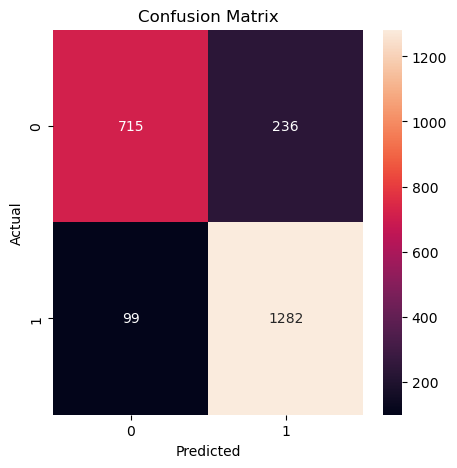

              precision    recall  f1-score   support

           0       0.88      0.75      0.81       951
           1       0.84      0.93      0.88      1381

    accuracy                           0.86      2332
   macro avg       0.86      0.84      0.85      2332
weighted avg       0.86      0.86      0.85      2332



,Coefficient,Adjusted Probability,prob_lowLifeExpectancy
Public Health Ins,-0.037199,0.392962,0.607038
Unemployed,-0.027277,0.395331,0.604669
Some HS,-0.022026,0.396587,0.603413
One Vehicle,-0.018639,0.397398,0.602602
Female,-0.017823,0.397594,0.602406
Public Transit,-0.014747,0.398330,0.601670
Family Poverty,-0.014147,0.398474,0.601526
HS Graduates,-0.009257,0.399647,0.600353
No Vehicles,-0.008242,0.399890,0.600110
Walked,-0.006983,0.400193,0.599807


In [81]:
#scikit regression
from sklearn.linear_model import LogisticRegression
df = model

y=df['Life Expectancy_abvavg']
X=df[['Labor Force', 'Unemployed', 'Employed',
       'Family Poverty', 'No HS', 'Some HS', 'HS Graduates',
       'Bachelors Degree', 'Grad/Prof Degree', 'Private Health Ins',
       'Public Health Ins', 'No Health Ins', 'No Vehicles', 'One Vehicle',
       'Two Vehicles', 'Three+ Vehicles', 'Drive Alone', 'Carpooled', 'Walked',
       'Other means', 'WFH', 'Public Transit', 'Total Population', 'Male',
       'Female']]
seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

#regression
reg = LogisticRegression(solver='saga', max_iter=10000)
reg.fit(X_train, y_train)

auc = roc_auc_score(y_test, reg.predict_proba(X_test)[:, 1])
print("AUC: {:.3f}".format(auc))

y_pred=reg.predict(X_test)

#plot confusion matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#summary of model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

# Retrieve the coefficients of the model
coefficients = reg.coef_

# Retrieve the intercept of the model
intercept = reg.intercept_

# If you have feature names available (e.g., from a DataFrame), you can pair them with the coefficients like this:
feature_names = X_train.columns # This assumes X_train is a DataFrame
feature_coefficients = dict(zip(feature_names, coefficients[0]))

#save to pd
coefficients = pd.DataFrame.from_dict(feature_coefficients, orient='index', columns=['Coefficient'])
coefficients['Adjusted Probability'] = coefficients['Coefficient'].apply(adj_prob)
coefficients['prob_lowLifeExpectancy'] = 1 - coefficients['Adjusted Probability']
#order by adjusted probability
coefficients = coefficients.sort_values(by='prob_lowLifeExpectancy', ascending=False)
coefficients

AUC: 0.917


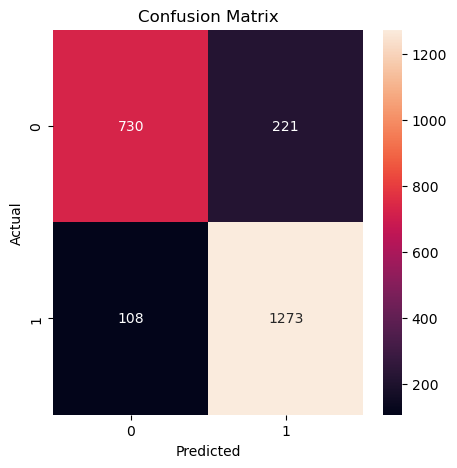

              precision    recall  f1-score   support

           0       0.87      0.77      0.82       951
           1       0.85      0.92      0.89      1381

    accuracy                           0.86      2332
   macro avg       0.86      0.84      0.85      2332
weighted avg       0.86      0.86      0.86      2332



,Coefficient,Adjusted Probability,prob_lowLifeExpectancy
area_Far South Side,-1.679586,0.111326,0.888674
area_Far Southwest Side,-1.626125,0.116726,0.883274
vehicle_cat_Three+ Vehicles,-1.304747,0.154149,0.845851
area_South Side,-1.266939,0.159143,0.840857
area_West Side,-1.085144,0.185001,0.814999
Unemployed_cat_25 or more,-1.070584,0.187207,0.812793
Unemployed_cat_15-20%,-1.032543,0.193064,0.806936
education_cat_Some HS,-1.030915,0.193318,0.806682
transport_cat_Carpooled,-0.739564,0.242827,0.757173
Unemployed_cat_20-25%,-0.572380,0.274869,0.725131


In [58]:
#scikit regression
from sklearn.linear_model import LogisticRegression
df = model

y=df['Life Expectancy_abvavg']
X=df[['Unemployed_cat_10-15%','Unemployed_cat_15-20%', 'Unemployed_cat_20-25%','Unemployed_cat_25 or more', 'Unemployed_cat_5-10%','Unemployed_cat_less than 5%', 'sex_cat_More Men', 'sex_cat_More Women','vehicle_cat_No Vehicles', 'vehicle_cat_One Vehicle','vehicle_cat_Three+ Vehicles', 'vehicle_cat_Two Vehicles','transport_cat_Carpooled', 'transport_cat_Drive Alone','transport_cat_Public Transit', 'transport_cat_Walked','education_cat_Bachelors Degree', 'education_cat_Grad/Prof Degree','education_cat_HS Graduates', 'education_cat_No HS','education_cat_Some HS', 'health_ins_cat_No Health Ins','health_ins_cat_Private Health Ins', 'health_ins_cat_Public Health Ins','area_Central', 'area_Far North Side', 'area_Far South Side','area_Far Southwest Side', 'area_North Side', 'area_Northwest Side','area_South Side', 'area_Southwest Side', 'area_West Side']]

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

#regression
reg = LogisticRegression(solver='saga', max_iter=1000)
reg.fit(X_train, y_train)

auc = roc_auc_score(y_test, reg.predict_proba(X_test)[:, 1])
print("AUC: {:.3f}".format(auc))

y_pred=reg.predict(X_test)

#plot confusion matrix
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5,5))
sns.heatmap(cm, annot=True, fmt="d")
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

#summary of model
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

# Retrieve the coefficients of the model
coefficients = reg.coef_

# Retrieve the intercept of the model
intercept = reg.intercept_

# If you have feature names available (e.g., from a DataFrame), you can pair them with the coefficients like this:
feature_names = X_train.columns # This assumes X_train is a DataFrame
feature_coefficients = dict(zip(feature_names, coefficients[0]))

#save to pd
coefficients = pd.DataFrame.from_dict(feature_coefficients, orient='index', columns=['Coefficient'])
coefficients['Adjusted Probability'] = coefficients['Coefficient'].apply(adj_prob)
coefficients['prob_lowLifeExpectancy'] = 1 - coefficients['Adjusted Probability']
#order by adjusted probability
coefficients = coefficients.sort_values(by='prob_lowLifeExpectancy', ascending=False)
coefficients


## Import model and set X Y Train Test

In [12]:
model1=model

In [13]:
#summary regression model
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
import numpy as np

df=model1

y=df['Life Expectancy']
X=df[['Labor Force', 'Unemployed', 'Employed',
       'Family Poverty', 'No HS', 'Some HS', 'HS Graduates',
       'Bachelors Degree', 'Grad/Prof Degree', 'Private Health Ins',
       'Public Health Ins', 'No Health Ins', 'No Vehicles', 'One Vehicle',
       'Two Vehicles', 'Three+ Vehicles', 'Drive Alone', 'Carpooled', 'Walked',
       'Other means', 'WFH', 'Public Transit', 'Total Population', 'Male',
       'Female','area_Far North Side', 'area_Far South Side',
       'area_Far Southwest Side', 'area_North Side', 'area_Northwest Side',
       'area_South Side', 'area_Southwest Side', 'area_West Side']]

seed = 42
np.random.seed(seed)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=seed)

## Linear Regression: OLS

### OLS Summary

In [13]:
#sm regression
X_train = sm.add_constant(X_train)
model = sm.OLS(y_train, X_train).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        Life Expectancy   R-squared:                       0.682
Model:                            OLS   Adj. R-squared:                  0.680
Method:                 Least Squares   F-statistic:                     621.4
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        19:28:41   Log-Likelihood:                -22062.
No. Observations:                9326   AIC:                         4.419e+04
Df Residuals:                    9293   BIC:                         4.443e+04
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

### Residual Distributions

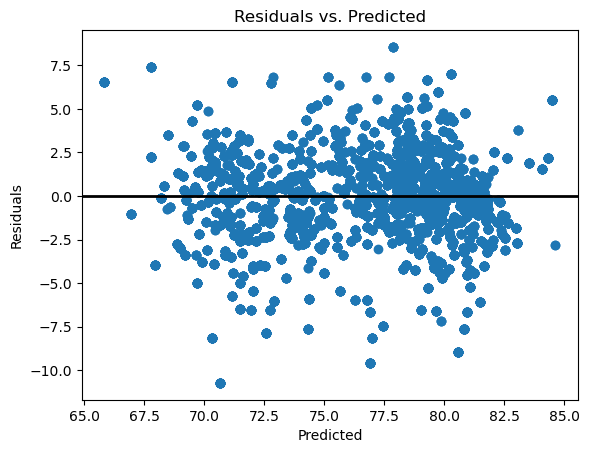

In [14]:
#plot residuals
import matplotlib.pyplot as plt
import seaborn as sns
y_pred = model.predict(X_train)
residuals = y_train - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted')
plt.axhline(0, color='black', lw=2)
plt.show()

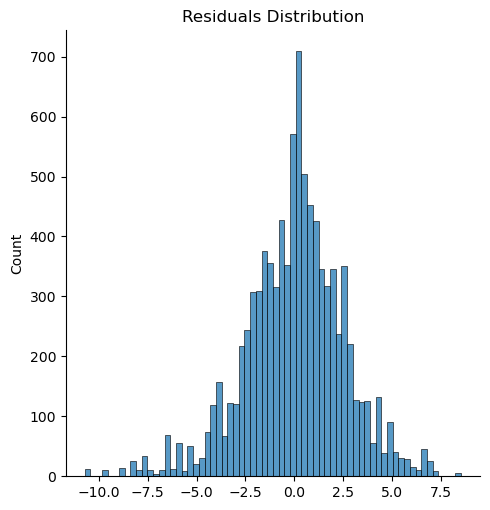

In [15]:
#distribution of residuals
sns.displot(residuals)
plt.title('Residuals Distribution')
plt.show()

## XGBOOST

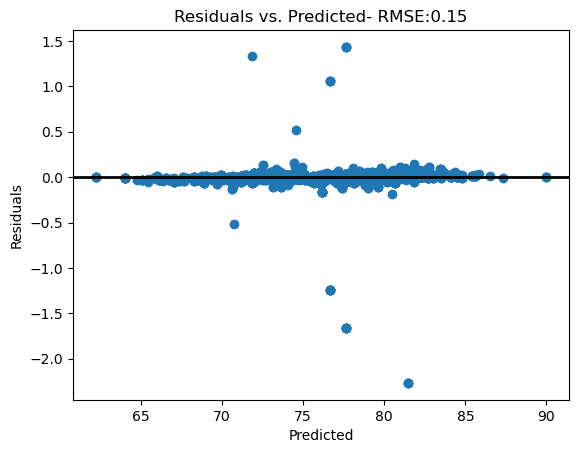

In [14]:
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
# Perform some operations on y and X
# ...
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the XGBoost model
xgb_model = xgb.XGBRegressor()

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = xgb_model.predict(X_test)

# Calculate the root mean squared error (RMSE)
rmse = mean_squared_error(y_test, y_pred, squared=False)

#plot residuals
import matplotlib.pyplot as plt
import seaborn as sns
residuals = y_test - y_pred
plt.scatter(y_pred, residuals)
plt.xlabel('Predicted')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted'+'- RMSE:'+str(rmse.round(2)))
plt.axhline(0, color='black', lw=2)
plt.show()

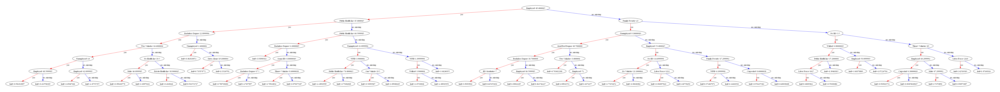

In [19]:
# Create a larger figure and increase DPI
plt.figure(figsize=(20, 15), dpi=500)  # You can adjust the size and DPI as needed

# Plot the first tree with increased size
xgb.plot_tree(xgb_model, num_trees=0, ax=plt.gca())

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


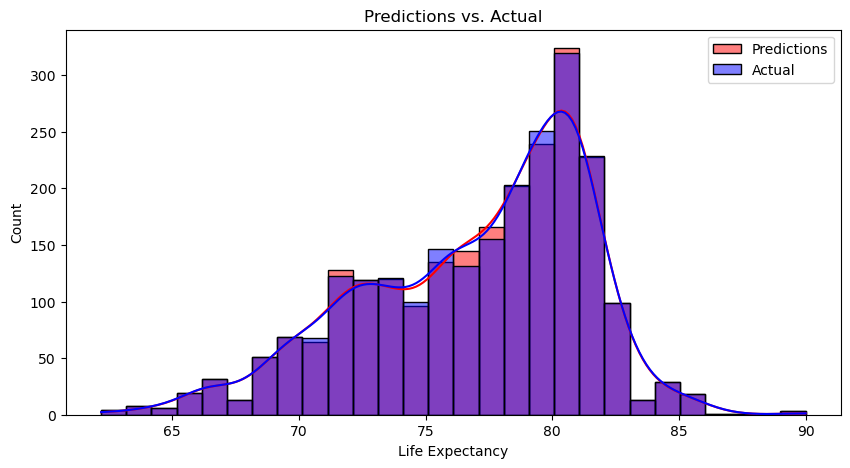

In [10]:
#histogram of y_pred and y_test on top of eachother
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(10, 5))
sns.histplot(y_pred, kde=True, color='red', label='Predictions')
sns.histplot(y_test, kde=True, color='blue', label='Actual')
plt.title('Predictions vs. Actual')
plt.legend()
plt.show()


## SHAP Application

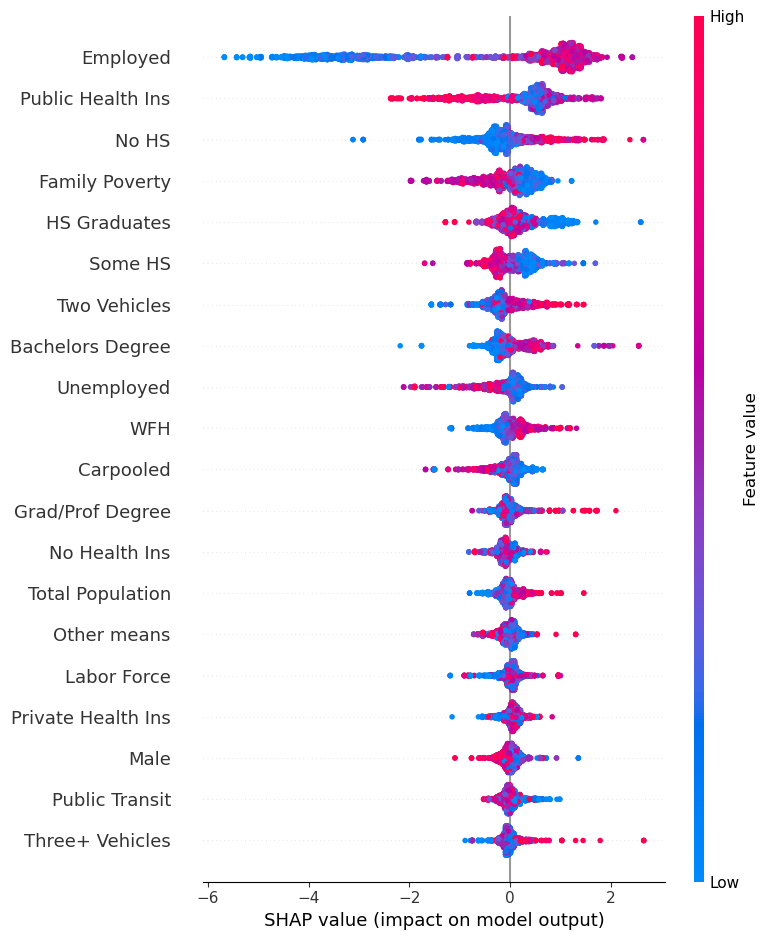

In [15]:
#SHAP application to xgboost above
import shap
#make shap plot normal size
shap.initjs()
explainer = shap.Explainer(xgb_model)
shap_values = explainer(X_test)
shap.summary_plot(shap_values, X_test)

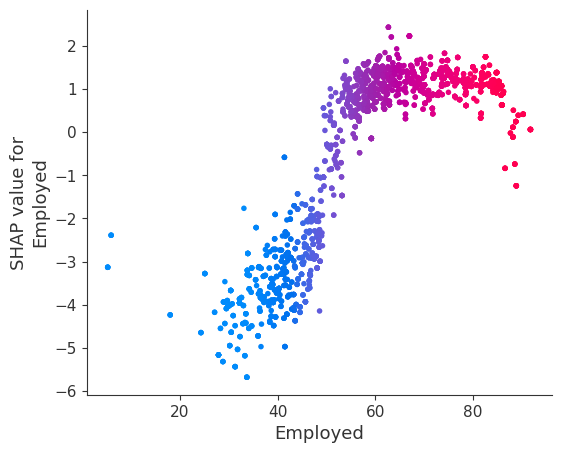

In [34]:
shap.dependence_plot('Employed', shap_values.values, X_test, interaction_index="Employed")

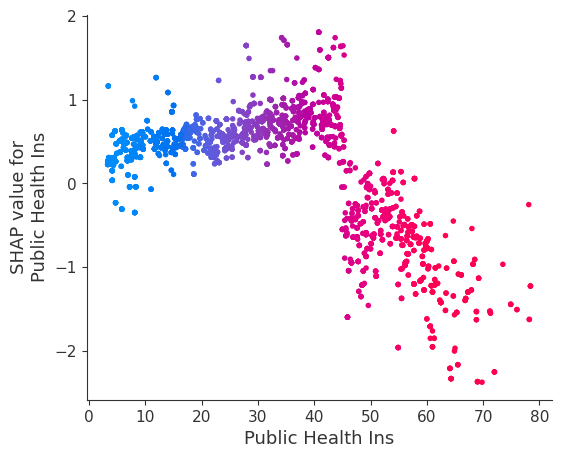

In [17]:
shap.dependence_plot('Public Health Ins', shap_values.values, X_test, interaction_index="Public Health Ins")

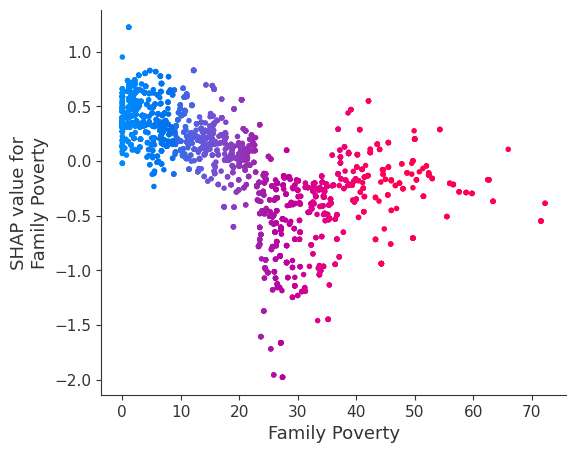

In [20]:
shap.dependence_plot('Family Poverty', shap_values.values, X_test, interaction_index="Family Poverty")

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


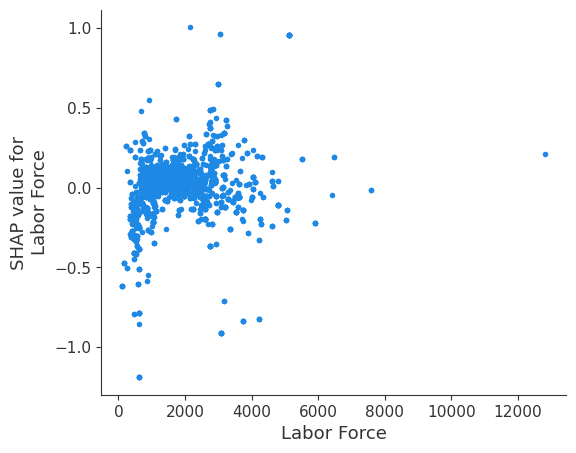

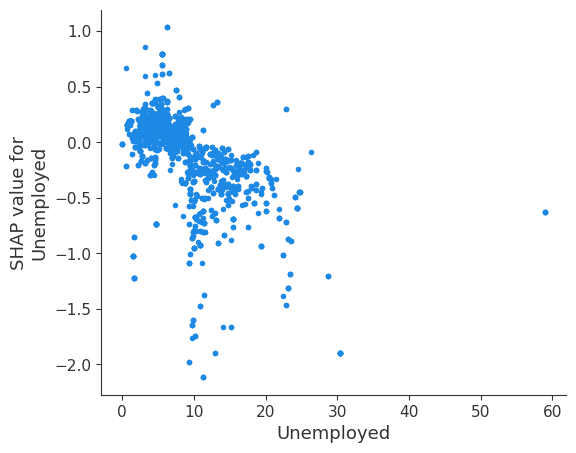

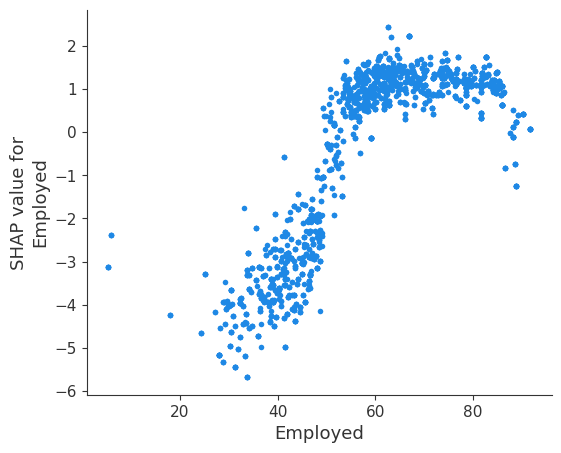

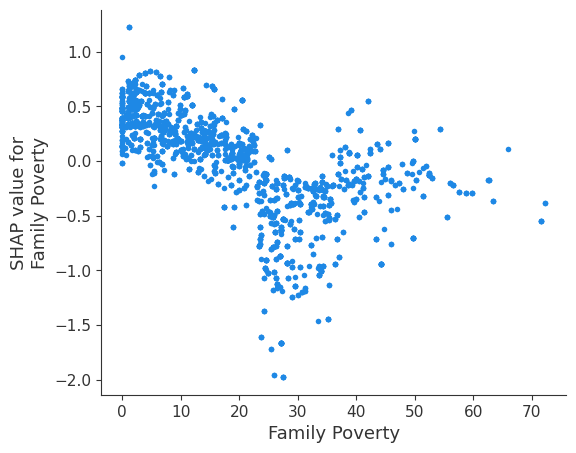

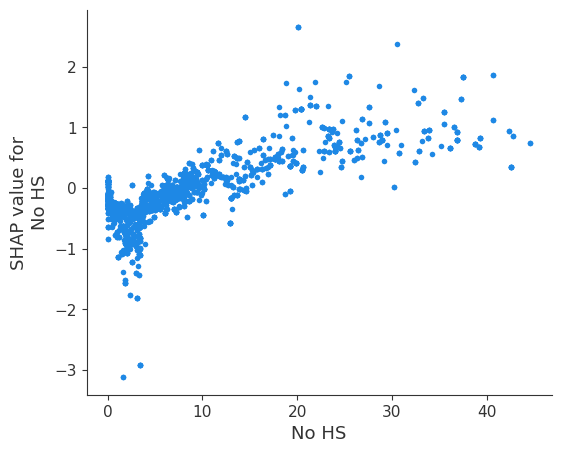

...

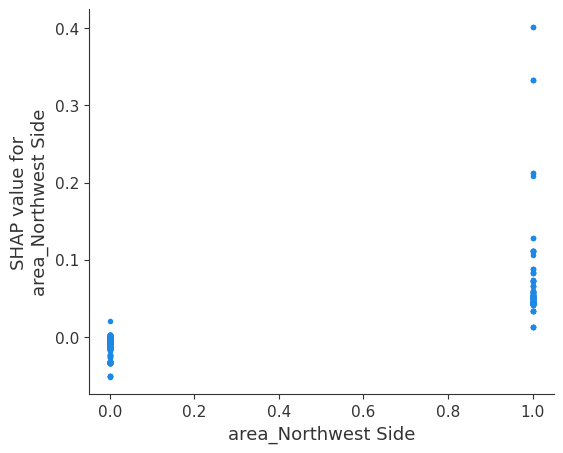

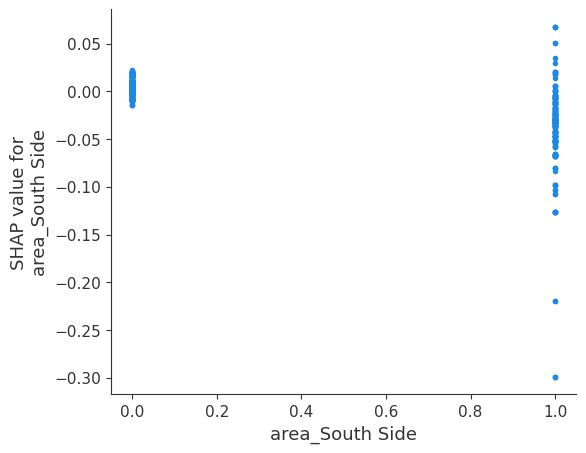

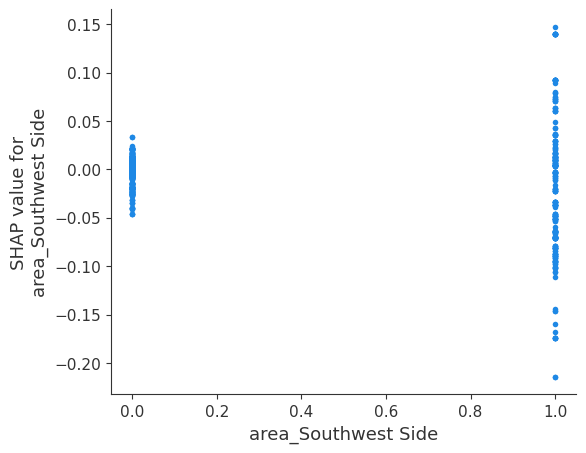

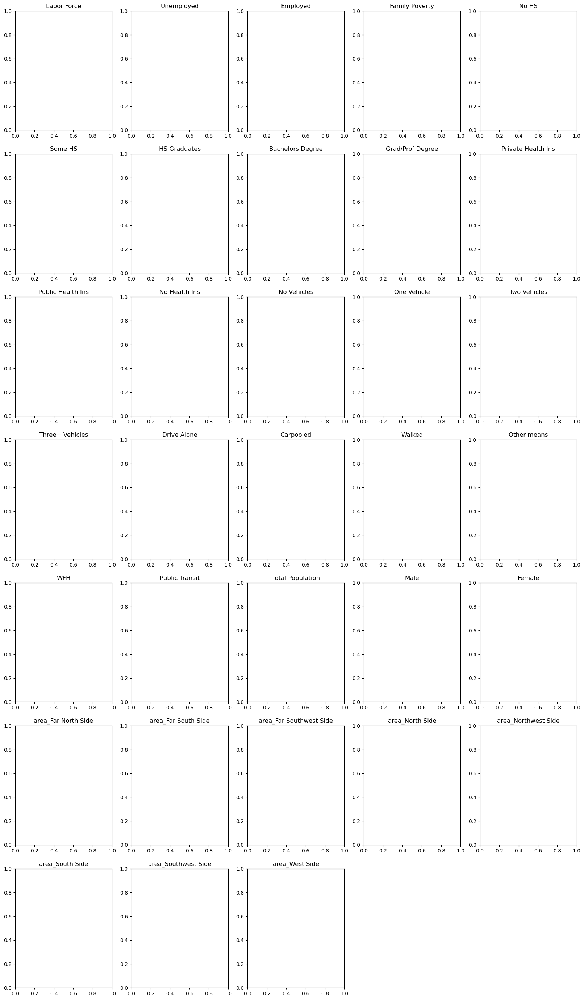

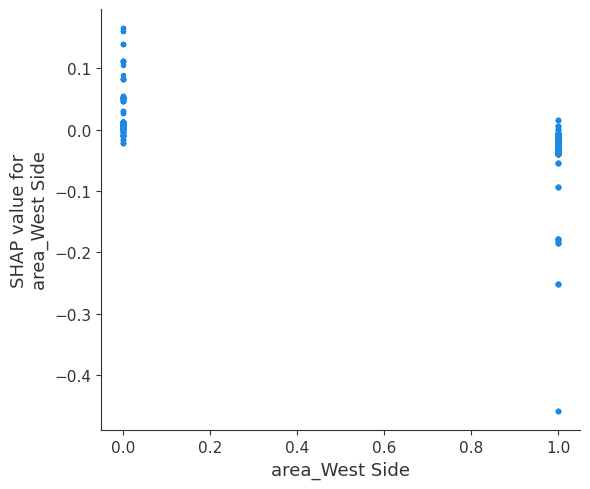

In [27]:
import matplotlib.pyplot as plt
import shap  # Assuming shap is already imported and shap_values, X_test are defined

# Combine all features into a single list for simplicity
features = ['Labor Force', 'Unemployed', 'Employed',
       'Family Poverty', 'No HS', 'Some HS', 'HS Graduates',
       'Bachelors Degree', 'Grad/Prof Degree', 'Private Health Ins',
       'Public Health Ins', 'No Health Ins', 'No Vehicles', 'One Vehicle',
       'Two Vehicles', 'Three+ Vehicles', 'Drive Alone', 'Carpooled', 'Walked',
       'Other means', 'WFH', 'Public Transit', 'Total Population', 'Male',
       'Female','area_Far North Side', 'area_Far South Side',
       'area_Far Southwest Side', 'area_North Side', 'area_Northwest Side',
       'area_South Side', 'area_Southwest Side', 'area_West Side']

# Calculate the number of rows needed for 5 plots per row
n_features = len(features)
n_cols = 5  # Number of columns per row
n_rows = (n_features + n_cols - 1) // n_cols  # Calculate rows needed, round up

# Create figure with calculated rows and columns
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

# Flatten the axs array for easier indexing if there are multiple rows
axs = axs.flatten()

for i, feature in enumerate(features):
    plt.sca(axs[i])  # Set the current Axes to axs[i]
    shap.dependence_plot(feature, shap_values.values, X_test, interaction_index=None, show=False)
    axs[i].set_title(feature)  # Set title for each subplot for clarity

# Hide any unused subplots if the number of features is not a multiple of 5
for ax in axs[i+1:]:
    ax.axis('off')

plt.tight_layout()  # Adjust layout so labels don't overlap
plt.show()

## Survival Function

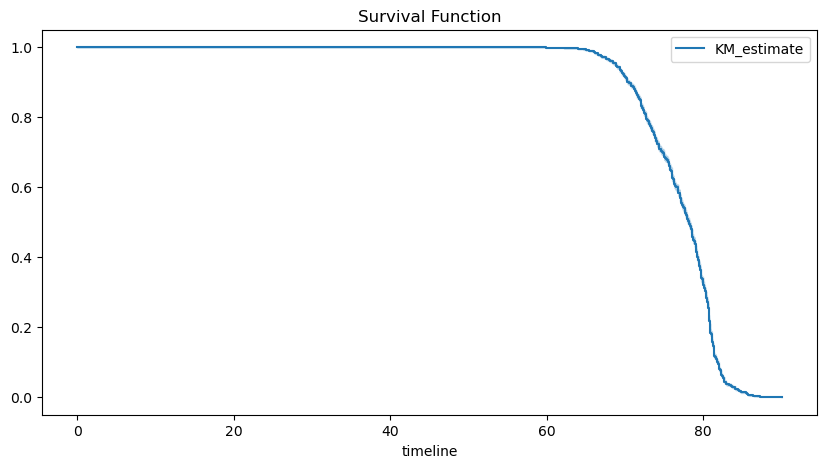

In [35]:
#survival analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from lifelines import KaplanMeierFitter

# Create a KaplanMeierFitter instance
kmf = KaplanMeierFitter()

# Fit the model on the data
kmf.fit(durations=df['Life Expectancy'])

#reset plot size
plt.figure(figsize=(10, 5))

# Create an estimate of the survival function
kmf.plot()
plt.title('Survival Function')
plt.show()


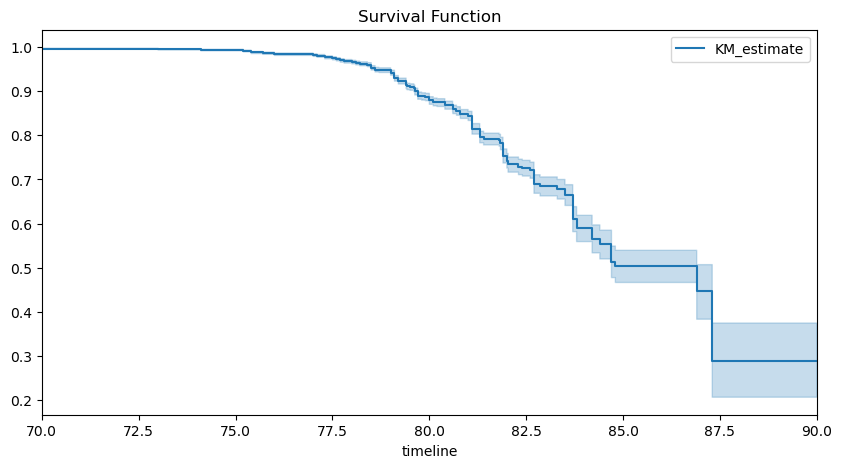

In [70]:
#change plot axis to be between 70 and 90
plt.figure(figsize=(10, 5))
kmf.plot()
plt.xlim(70, 90)
plt.title('Survival Function')
plt.show()